In [1]:
include("../../src/WaterLily.jl")
#using WaterLily
WaterLily = Main.WaterLily;
using Plots; gr()
using StaticArrays

In [2]:
inside(a::AbstractArray) = CartesianIndices(map(ax->first(ax)+1:last(ax)-1,axes(a)))

inside (generic function with 1 method)

In [3]:
function flood(f::Array;shift=(0.,0.),cfill=:RdBu_11,clims=(),levels=10,kv...)
    if length(clims)==2
        @assert clims[1]<clims[2]
        @. f=min(clims[2],max(clims[1],f))
    else
        clims = (minimum(f),maximum(f))
    end
    Plots.contourf(axes(f,1).+shift[1],axes(f,2).+shift[2],f',
        linewidth=0, levels=levels, color=cfill, clims = clims, 
        aspect_ratio=:equal; kv...)
end

addbody(x,y;c=:black) = Plots.plot!(Shape(x,y), c=c, legend=false)
function body_plot!(sim;levels=[0],lines=:black,R=inside(sim.flow.p))
    WaterLily.measure_sdf!(sim.flow.σ,sim.body,WaterLily.time(sim))
    contour!(sim.flow.σ[R]';levels,lines)
end

function sim_gif!(sim;duration=1,step=0.1,verbose=true,R=inside(sim.flow.p),
                    remeasure=false,plotbody=false,kv...)
    t₀ = round(WaterLily.sim_time(sim))
    @time @gif for tᵢ in range(t₀,t₀+duration;step)
        WaterLily.sim_step!(sim,tᵢ;remeasure)
        for I∈inside(sim.flow.σ)
            sim.flow.σ[I] = WaterLily.curl(3,I,sim.flow.u)*sim.L/sim.U
        end
        flood(sim.flow.σ[R]; kv...)
        plotbody && body_plot!(sim)
        verbose && println("tU/L=",round(tᵢ,digits=4),
            ", Δt=",round(sim.flow.Δt[end],digits=3))
    end
end

sim_gif! (generic function with 1 method)

In [4]:
function circle(n,m,r,x0,y0,Ux,Uy;Re=250)
    radius = r
    U = √(Ux*Ux+Uy*Uy)
    function SDF(xyz,t)
        xc = x0
        yc = y0
        x,y = @. (xyz-1.5)
        return sqrt.((mod.(x.-xc,n)-n/2).^2+(mod.(y.-yc,m)-m/2).^2) .- radius
    end
    function MAP(xyz,t)
        return xyz .- SA[5*Ux*t*U/radius, 5*Uy*t*U/radius]
    end
    body = WaterLily.AutoBody(SDF,MAP)
    return WaterLily.Simulation((n,m), (0,0), radius; U, ν=U*radius/Re, body)
end

circle (generic function with 1 method)

In [5]:
function circle(n,m;Re=250,U=1)
    radius, center = m/8, m/2
    body_sdf = (x,t) -> √sum(abs2, x .- center) - radius
    body_map = (x,t) -> x .- 25*cos(0.5t*U/radius) 
    return WaterLily.Simulation((n,m), (0,0), radius; U, ν=U*radius/Re, body=WaterLily.AutoBody(body_sdf,body_map))
end

circle (generic function with 2 methods)

In [9]:
sim = circle(2^7,2^7,2^5,2^6,2^6,1,1.5)
sim = circle(2^7,2^7,2^4,2^7,2^7,0,1)
#sim = circle(2^7,2^7)
# sim = hover()

Main.WaterLily.Simulation(1.0, 16, 1, Main.WaterLily.Flow{2, Float32, Matrix{Float32}, Array{Float32, 3}, Array{Float32, 4}}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Float32[0.0 0.0 … 0.0 0.0; 0.0 73.80256 … 73.80256 0.0; … ; 0.0 73.80256 … 73.80256 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0;;; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Float32[0.0 0.0 … 0.0

 86.690690 seconds (279.58 M allocations: 22.768 GiB, 3.19% gc time)


┌ Info: Saved animation to /tmp/jl_griransXgX.gif
└ @ Plots /home/tyhuang/.julia/packages/Plots/QWCV6/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_griransXgX.gif")
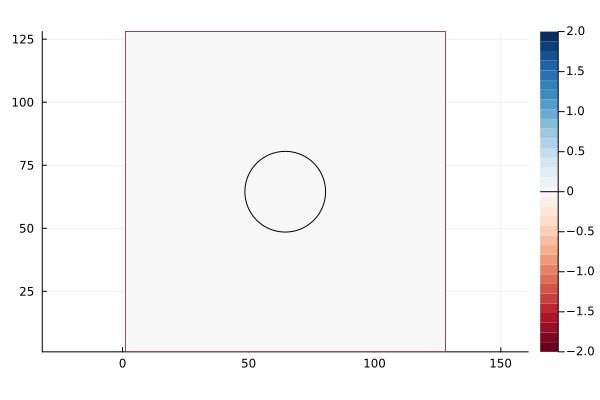

In [10]:
sim_gif!(sim,duration=100, step=0.1,clims=(-2,2),plotbody=true,verbose=false,levels=32,remeasure=true)